# 🛡️ Adversarial Attack Evaluation
In this notebook, we evaluate the robustness of three machine learning models (Logistic Regression, Random Forest, XGBoost) used in phishing detection against **black-box adversarial attacks**.

We aim to understand how the models perform when facing inputs intentionally perturbed to fool them, and explain why certain attack strategies are more applicable than others.

In [1]:
import shap
import matplotlib.pyplot as plt

## ⚙️ Attack Strategy Rationale
Initially, we considered using **Fast Gradient Sign Method (FGSM)** and **HopSkipJump**. However:

- FGSM is only suitable for **differentiable models** and requires **gradient access**, which is not available for Random Forest or XGBoost.
- HopSkipJump is a black-box method, but it's **very slow** on tabular datasets and became impractical in our GitHub Codespaces setup.

We decided to use **BoundaryAttack**, which is a black-box attack that:
- Works with non-differentiable models
- Requires only model predictions (not gradients)
- Is significantly faster than HopSkipJump on structured data like ours

In [2]:
# ✅ Load libraries
import pandas as pd
import matplotlib.pyplot as plt
import json

## 📥 Load Evaluation Outputs
These files are generated from the `run_adversarial_eval.py` script:
- `data/adversarial_predictions.csv`: predictions made on adversarial samples
- `metrics/adversarial_metrics.json`: accuracy of each model on adversarial inputs

In [24]:
# Load adversarial predictions
adv_preds = pd.read_csv('../data/adversarial_predictions.csv')
adv_preds.head()

,true_label,pred_lr,pred_rf,pred_xgb
0,0,1,1,0
1,0,1,1,0
2,0,1,1,0
3,1,1,1,0
4,1,1,1,0


In [25]:
# Load adversarial evaluation metrics
with open('../metrics/adversarial_metrics.json') as f:
    adv_metrics = json.load(f)
adv_metrics

{'lr_accuracy_adv': 0.565, 'rf_accuracy_adv': 0.565, 'xgb_accuracy_adv': 0.435}

## 📊 Model Performance on Adversarial Samples
We now compare how each model performed when facing adversarially perturbed samples. These attacks were designed to minimally change the input while flipping the model's prediction.

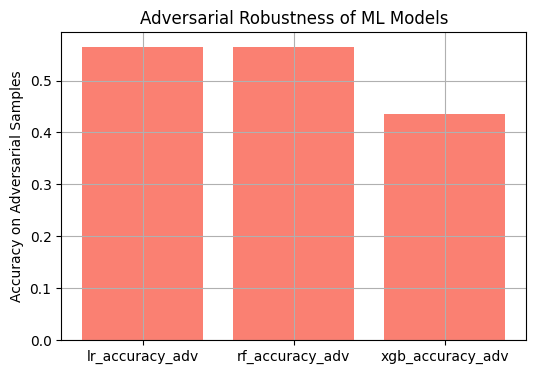

In [26]:
# Plot adversarial accuracy
plt.figure(figsize=(6,4))
plt.bar(adv_metrics.keys(), adv_metrics.values(), color='salmon')
plt.ylabel('Accuracy on Adversarial Samples')
plt.title('Adversarial Robustness of ML Models')
plt.grid(True)
plt.show()

In [27]:
# Load original features
X = pd.read_csv('../data/phishing.csv').drop('Result', axis=1)
y = pd.read_csv('../data/phishing.csv')['Result'].replace({-1: 0, 1: 1})

# Load adversarial samples (Logistic Regression version for now)
X_adv_lr = pd.read_csv('../data/X_adv_lr.csv')

## 🧠 SHAP Explanations for Adversarial Predictions

SHAP (SHapley Additive exPlanations) provides **model-aware feature attribution** by assigning each input feature a contribution score toward a prediction.

Unlike LIME, SHAP builds on a solid theoretical foundation from cooperative game theory. This makes it highly reliable when evaluating how a model makes decisions — especially in security contexts like phishing detection.

In adversarial scenarios, SHAP helps us understand whether the model’s reasoning **remains consistent** or becomes manipulated due to subtle input perturbations.

### ✅ SHAP Explanation for Logistic Regression

SHAP values break down the contribution of each feature to the model’s output probability.
For this adversarial sample, we can see which features **pushed the model toward classifying it as phishing** or legitimate.
This helps us understand how the model reacts under attack.

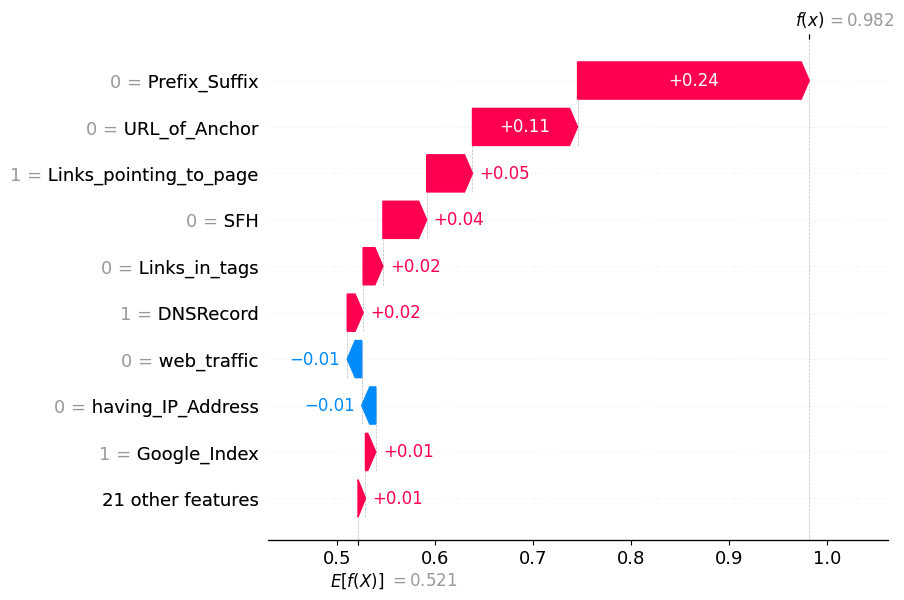

In [7]:
import shap
import joblib
import matplotlib.pyplot as plt

# Load model and data
model_lr = joblib.load('../models/phishing_model_lr.pkl')
X = pd.read_csv('../data/phishing.csv').drop('Result', axis=1)
X_adv_lr = pd.read_csv('../data/X_adv_lr.csv')

# Create SHAP explainer and compute values
explainer = shap.Explainer(model_lr.predict_proba, X)
shap_values_adv = explainer(X_adv_lr[:10])

# Waterfall plot for class 1
shap.plots.waterfall(shap.Explanation(
    values=shap_values_adv.values[0][:, 1],
    base_values=shap_values_adv.base_values[0][1],
    data=shap_values_adv.data[0],
    feature_names=shap_values_adv.feature_names
))

### ✅ SHAP Explanation for Random Forest

SHAP gives insight into the influence of individual features across multiple decision paths in the Random Forest. In adversarial examples, some features might become misleading, and this plot shows that shift.

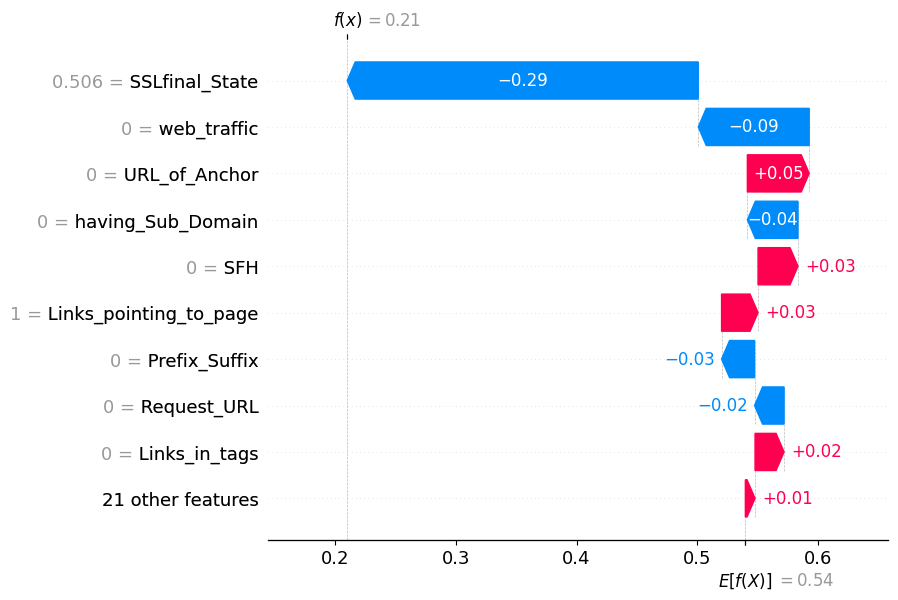

In [8]:
model_rf = joblib.load('../models/phishing_model_rf.pkl')
X_adv_rf = pd.read_csv('../data/X_adv_rf.csv')
explainer_rf = shap.Explainer(model_rf.predict_proba, X)
shap_values_rf = explainer_rf(X_adv_rf[:10])
shap.plots.waterfall(shap.Explanation(
    values=shap_values_rf.values[0][:, 1],
    base_values=shap_values_rf.base_values[0][1],
    data=shap_values_rf.data[0],
    feature_names=shap_values_rf.feature_names
))

### ✅ SHAP Explanation for XGBoost

As a gradient-boosted tree ensemble, XGBoost can exhibit subtle changes in prediction. SHAP explains which features had disproportionate influence on the adversarial classification result.

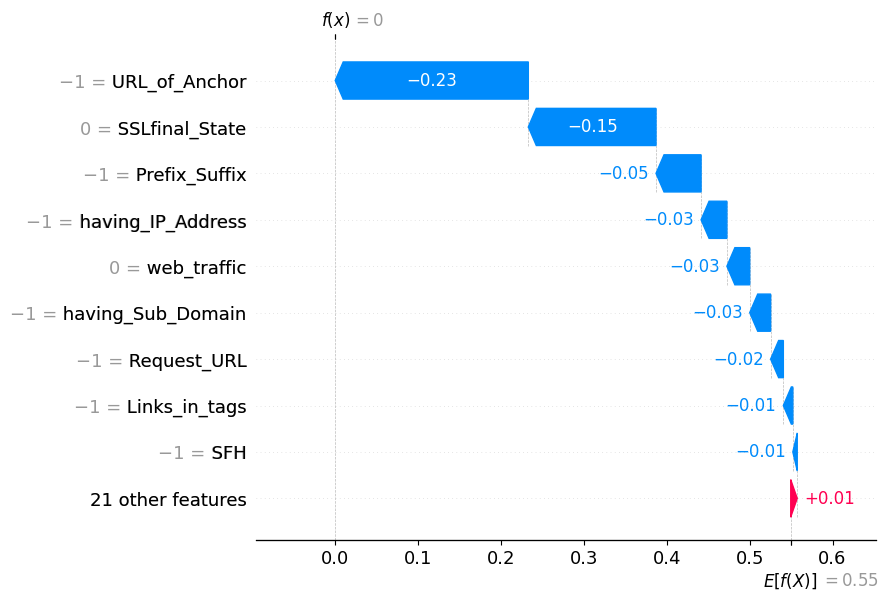

In [20]:
model_xgb = joblib.load('../models/phishing_model_xgb.pkl')
X_adv_xgb = pd.read_csv('../data/X_adv_xgb.csv')
explainer_xgb = shap.Explainer(model_xgb.predict_proba, X)
shap_values_xgb = explainer_xgb(X_adv_xgb[:10])
shap.plots.waterfall(shap.Explanation(
    values=shap_values_xgb.values[0][:, 1],
    base_values=shap_values_xgb.base_values[0][1],
    data=shap_values_xgb.data[0],
    feature_names=shap_values_xgb.feature_names
))

### 🧠 Reflection: Understanding SHAP Explanations

- 🔍 Which features had the **strongest influence** on the prediction (positive or negative)?
- 🟥 Which features pushed the prediction **toward phishing**?
- 🟦 Which features pushed the prediction **toward legitimate**?
- 🔁 Are the same features influential across multiple inputs or models?
- 🧠 Do the SHAP results match **your expectations** based on the feature names?
- 🛠️ If a model was fooled by an adversarial input, does the SHAP plot help you understand **why**?
- 🚩 Are there any features that seem to have a **surprising or suspicious influence**?



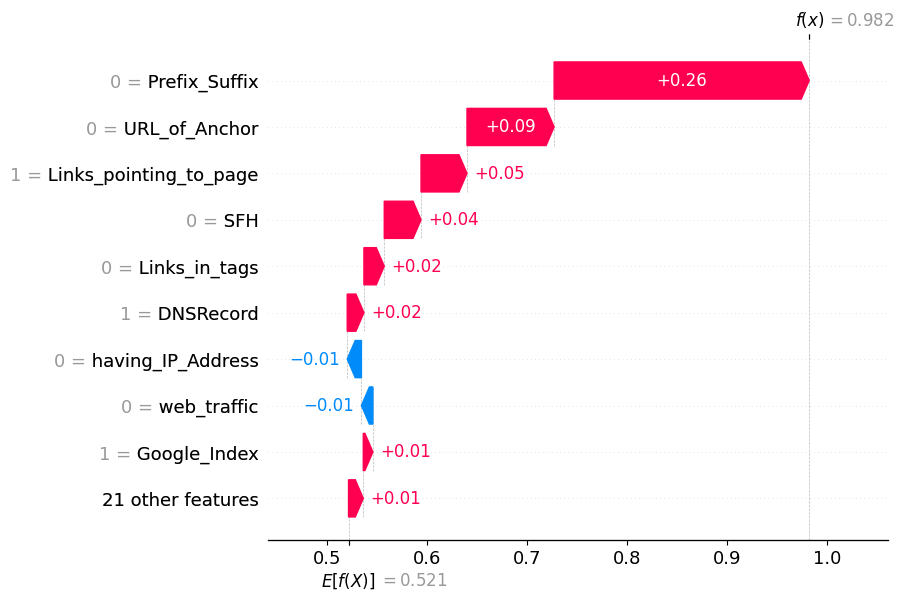

🔍 Logistic Regression - SHAP Waterfall


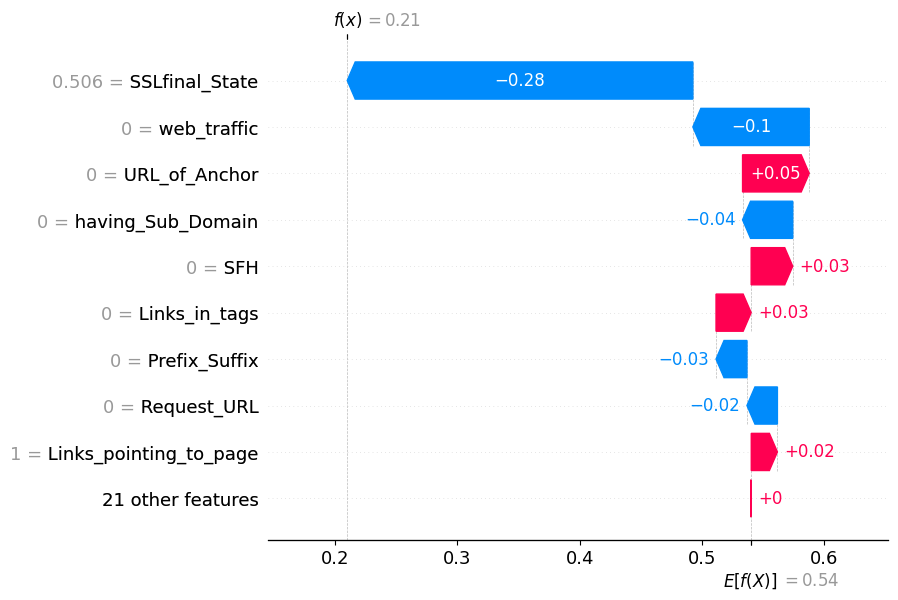

🌲 Random Forest - SHAP Waterfall


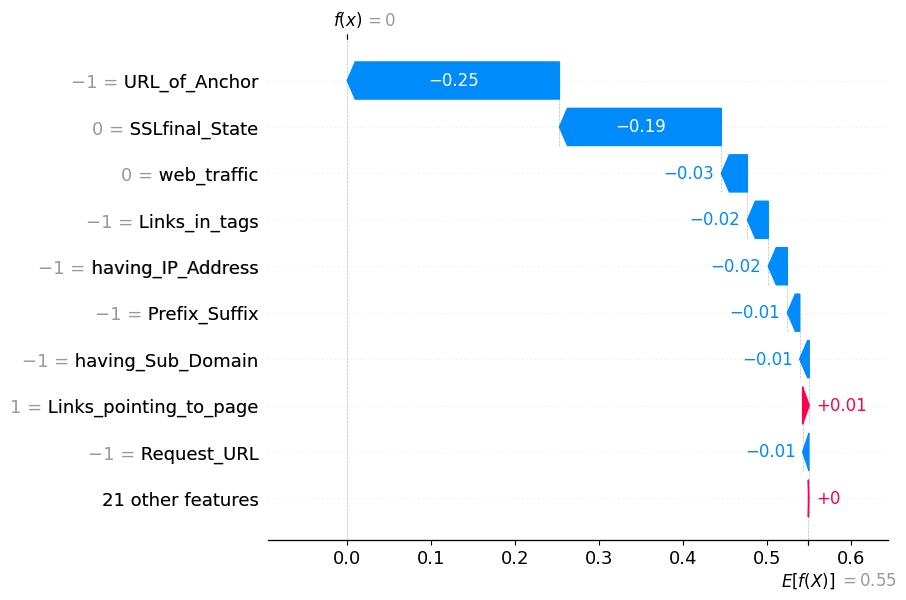

⚡ XGBoost - SHAP Waterfall


In [22]:
import shap
import pandas as pd

# -------------------------------
# Logistic Regression
explainer_lr = shap.Explainer(model_lr.predict_proba, X)
shap_values_lr = explainer_lr(X_adv_lr[:10])  # batch to reuse if needed
shap.plots.waterfall(shap.Explanation(
    values=shap_values_lr.values[0][:, 1],
    base_values=shap_values_lr.base_values[0][1],
    data=shap_values_lr.data[0],
    feature_names=shap_values_lr.feature_names
))
print("🔍 Logistic Regression - SHAP Waterfall")

# -------------------------------
# Random Forest
explainer_rf = shap.Explainer(model_rf.predict_proba, X)
shap_values_rf = explainer_rf(X_adv_rf[:10])
shap.plots.waterfall(shap.Explanation(
    values=shap_values_rf.values[0][:, 1],
    base_values=shap_values_rf.base_values[0][1],
    data=shap_values_rf.data[0],
    feature_names=shap_values_rf.feature_names
))
print("🌲 Random Forest - SHAP Waterfall")

# -------------------------------
# XGBoost
explainer_xgb = shap.Explainer(model_xgb.predict_proba, X)
shap_values_xgb = explainer_xgb(X_adv_xgb[:10])
shap.plots.waterfall(shap.Explanation(
    values=shap_values_xgb.values[0][:, 1],
    base_values=shap_values_xgb.base_values[0][1],
    data=shap_values_xgb.data[0],
    feature_names=shap_values_xgb.feature_names
))
print("⚡ XGBoost - SHAP Waterfall")


## 🔍 LIME Explanations for Adversarial Predictions
We use LIME to interpret model predictions on adversarial examples for all three classifiers.

Unlike SHAP, which is model-aware, LIME is **model-agnostic**. It perturbs the input and observes output changes to approximate a local linear explanation. This makes it valuable for debugging black-box behavior of classifiers, especially under adversarial conditions.

In [11]:
# ✅ Imports and data loading for LIME
import pandas as pd
import joblib
import lime
from lime.lime_tabular import LimeTabularExplainer

# Load original and adversarial datasets
X = pd.read_csv('../data/phishing.csv').drop('Result', axis=1)
X_adv_lr = pd.read_csv('../data/X_adv_lr.csv')
X_adv_rf = pd.read_csv('../data/X_adv_rf.csv')
X_adv_xgb = pd.read_csv('../data/X_adv_xgb.csv')

# Load models
model_lr = joblib.load('../models/phishing_model_lr.pkl')
model_rf = joblib.load('../models/phishing_model_rf.pkl')
model_xgb = joblib.load('../models/phishing_model_xgb.pkl')

# Create shared LIME explainer
lime_explainer = LimeTabularExplainer(
    X.values,
    feature_names=X.columns,
    class_names=['Phishing', 'Legitimate'],
    discretize_continuous=True
)

### ✅ LIME Explanation: Logistic Regression

LIME provides insight into **which features** most strongly influenced the model’s prediction for a given adversarial example. This helps us understand if the model’s reasoning aligns with human expectations, or if it’s being tricked by altered input features.

In [12]:
#lime_exp_lr = lime_explainer.explain_instance(X_adv_lr.iloc[0].values, model_lr.predict_proba)
#lime_exp_lr.show_in_notebook(show_table=True)


# Assume: X is your original (clean) dataset with feature names
# Assume: model_lr is your trained Logistic Regression model
# Assume: X_adv_lr is your adversarial input DataFrame (same columns as X)

# Step 1: Create the LIME explainer
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=X.values,
    feature_names=X.columns.tolist(),
    class_names=['Legitimate', 'Phishing'],
    mode='classification'
)

# Step 2: Pick an adversarial instance (first row)
instance = X_adv_lr.iloc[0]

# Step 3: Use a lambda to wrap the model's prediction with feature names
lime_exp_lr = lime_explainer.explain_instance(
    data_row=instance.values,
    predict_fn=lambda x: model_lr.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)

# Step 4: Show explanation
lime_exp_lr.show_in_notebook(show_table=True)


### ✅ LIME Explanation: Random Forest

In the Random Forest model, LIME highlights the aggregated impact of decision paths. If the adversarial attack causes the model to flip its decision, this visualization shows what features changed influence.

In [13]:
#lime_exp_rf = lime_explainer.explain_instance(X_adv_rf.iloc[0].values, model_rf.predict_proba)
#lime_exp_rf.show_in_notebook(show_table=True)

# Step 1: Pick an adversarial instance for Random Forest
instance_rf = X_adv_rf.iloc[0]

# Step 2: Generate the explanation using LIME
lime_exp_rf = lime_explainer.explain_instance(
    data_row=instance_rf.values,
    predict_fn=lambda x: model_rf.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)

# Step 3: Show the explanation in notebook
lime_exp_rf.show_in_notebook(show_table=True)


### ✅ LIME Explanation: XGBoost

XGBoost, being a boosted ensemble of trees, may focus on slightly different decision splits. LIME helps visualize which features gained or lost importance in adversarial scenarios.

In [14]:
#lime_exp_xgb = lime_explainer.explain_instance(X_adv_xgb.iloc[0].values, model_xgb.predict_proba)
#lime_exp_xgb.show_in_notebook(show_table=True)

# Step 1: Pick an adversarial instance for XGBoost
instance_xgb = X_adv_xgb.iloc[0]

# Step 2: Generate the explanation using LIME
lime_exp_xgb = lime_explainer.explain_instance(
    data_row=instance_xgb.values,
    predict_fn=lambda x: model_xgb.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)

# Step 3: Show the explanation in notebook
lime_exp_xgb.show_in_notebook(show_table=True)


### 🧠 Reflection: Comparing LIME Explanations Across Models

- ✅ Do all three models rely on the same key features for their decisions?
- 🧪 Did any model base its decision on an unexpected or weak feature?
- 🔁 Are the most important features consistent between models?
- 🔒 If you were an attacker, which feature would you change to fool each model?
- 🛡️ Which model seems easiest to defend — and which one feels riskier?



In [15]:
# Pick one instance from each adversarial dataset
instance_lr = X_adv_lr.iloc[0]
instance_rf = X_adv_rf.iloc[0]
instance_xgb = X_adv_xgb.iloc[0]

# Logistic Regression LIME explanation
lime_exp_lr = lime_explainer.explain_instance(
    data_row=instance_lr.values,
    predict_fn=lambda x: model_lr.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)
print("🔍 Logistic Regression LIME Explanation")
lime_exp_lr.show_in_notebook(show_table=True)

# Random Forest LIME explanation
lime_exp_rf = lime_explainer.explain_instance(
    data_row=instance_rf.values,
    predict_fn=lambda x: model_rf.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)
print("🌲 Random Forest LIME Explanation")
lime_exp_rf.show_in_notebook(show_table=True)

# XGBoost LIME explanation
lime_exp_xgb = lime_explainer.explain_instance(
    data_row=instance_xgb.values,
    predict_fn=lambda x: model_xgb.predict_proba(pd.DataFrame(x, columns=X.columns)),
    num_features=10
)
print("⚡ XGBoost LIME Explanation")
lime_exp_xgb.show_in_notebook(show_table=True)


🔍 Logistic Regression LIME Explanation


🌲 Random Forest LIME Explanation


⚡ XGBoost LIME Explanation
